In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio as rio
from rasterio.plot import show
from rasterio.plot import show_hist
import os
import fiona

In [2]:
!pwd

/c/Users/Bharath/anaconda3/envs/SG_Land_Reclamation_analysis


In [3]:
!ls

Approx_SG.kml
debug.log
Displaying images.ipynb
Extracting_SG_from_Landsat8_images.ipynb
Generated DataFrames
HDB data
Landsat_Image_processing_final_experiments.ipynb
Landsat8_image_processing_initial_experimentation.ipynb
Population_data_World_Bank.ipynb
Population_density_and_Housing_density_analysis.ipynb
Predicting the future of SG.ipynb
SG_cropped_Landsat8_images
SG_Landsat8_images
SG_shapefiles


In [4]:
os.chdir('SG_cropped_Landsat8_images/')


In [5]:
!pwd

/c/Users/Bharath/anaconda3/envs/SG_Land_Reclamation_analysis/SG_cropped_Landsat8_images


In [6]:
!ls

2013
2014
2015
2016
2017
2018
2019
2020


In [7]:
os.chdir('2013')

SG_Bands_2013 = {}

for i in range(1,12):
    var = 'B'+str(i)
    
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2013[var] = rio.open(img_file, 'r')

os.chdir('..')

In [8]:
os.chdir('2014')

SG_Bands_2014 = {}

for i in range(1,12):
    var = 'B'+str(i)
    
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2014[var] = rio.open(img_file, 'r')

os.chdir('..')

In [9]:
os.chdir('2015')

SG_Bands_2015 = {}

for i in range(1,12):
    var = 'B'+str(i)
    
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2015[var] = rio.open(img_file, 'r')

os.chdir('..')

In [10]:
os.chdir('2016')

SG_Bands_2016 = {}

for i in range(1,12):
    var = 'B'+str(i)
    
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2016[var] = rio.open(img_file, 'r')

os.chdir('..')

In [11]:
os.chdir('2017')

SG_Bands_2017 = {}

for i in range(1,12):
    var = 'B'+str(i)
    
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2017[var] = rio.open(img_file, 'r')

os.chdir('..')

In [12]:
os.chdir('2018')

SG_Bands_2018 = {}

for i in range(1,12):
    var = 'B'+str(i)
    
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2018[var] = rio.open(img_file, 'r')

os.chdir('..')

In [13]:
os.chdir('2019')

SG_Bands_2019 = {}

for i in range(1,12):
    var = 'B'+str(i)
    
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2019[var] = rio.open(img_file, 'r')

os.chdir('..')

In [14]:
os.chdir('2020')

SG_Bands_2020 = {}

for i in range(1,12):
    var = 'B'+str(i)
        
    img_file = 'SGimgB' + str(i) + '.TIF'
    SG_Bands_2020[var] = rio.open(img_file, 'r')

os.chdir('..')

#### Function to display Bands 1 - 9 for each of the cropped Landsat Image

In [15]:
def show_bands(dictionary):
    
    Bands = dictionary
    fig, ax = plt.subplots(3,3, figsize = (15,10))

    num = 0
    for i in range(3):
        for j in range(3):
            num += 1
            key = 'B' + str(num)
        
            ax[i,j].imshow(Bands[key].read(1))
            ax[i,j].set_xlabel(key)
        

#### Experimental function to check which bands would return best difference between Land and Water
- Experimenting to see which combination of Bands produces the best differentiation between Land and Water while avoiding clouds.
- This combination may be different for each Landsat scene.
- Using the cropped image of SG allows for much faster experimentation.

In [16]:
def experiment(dictionary, band_num):
    
    Bands = dictionary
    main_key = 'B' + str(band_num)
    
    fig, ax = plt.subplots(3,3, figsize = (15,10))
    
    num = 0
    for i in range(3):
        for j in range(3):
            num += 1
            key = 'B' + str(num)
            
            if num == 8: # Excluding Band 8 since it has higher resolution and cannot be subtracted due to shape mismatch
                continue
                
            ax[i,j].imshow(Bands[main_key].read(1) - Bands[key].read(1))
            ax[i,j].set_xlabel(main_key + " - " + key)
    

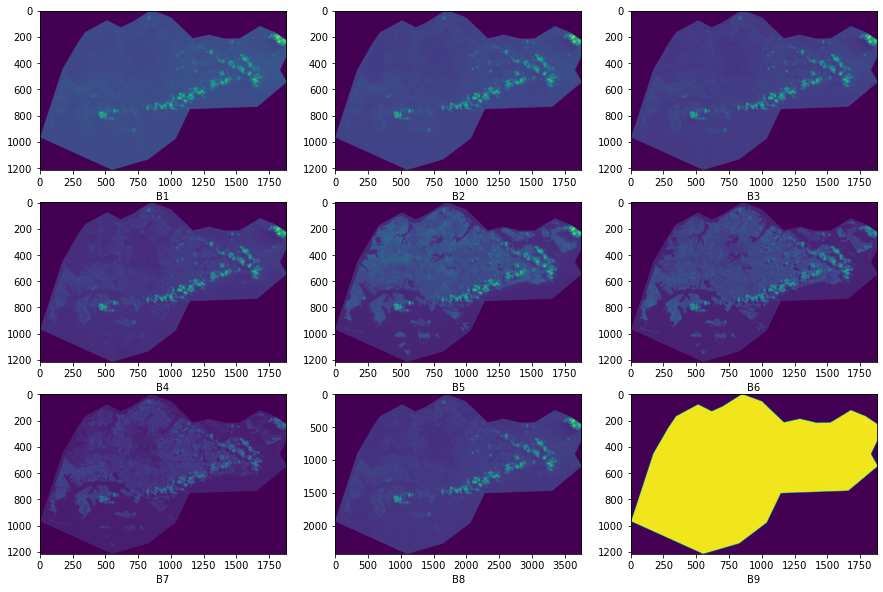

In [17]:
show_bands(SG_Bands_2013)

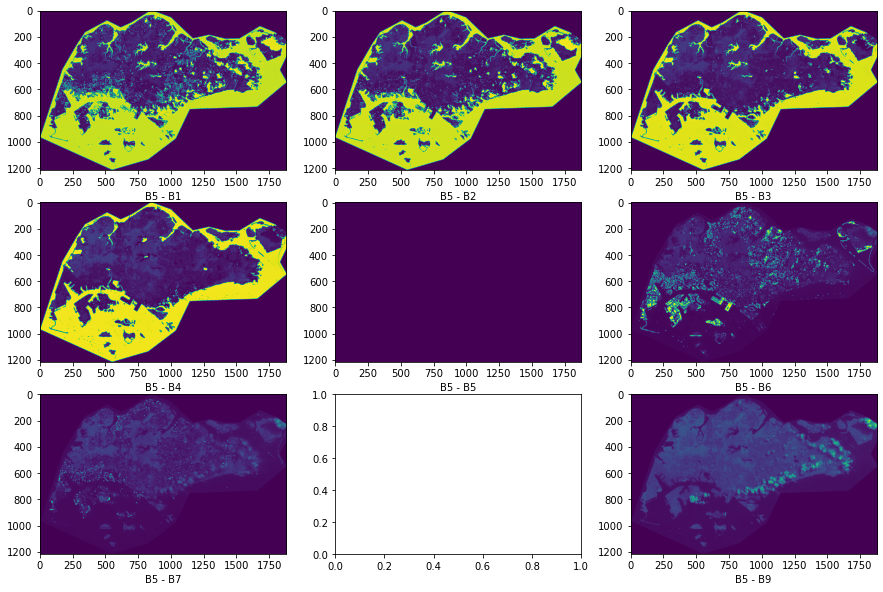

In [18]:
experiment(SG_Bands_2013, 5)

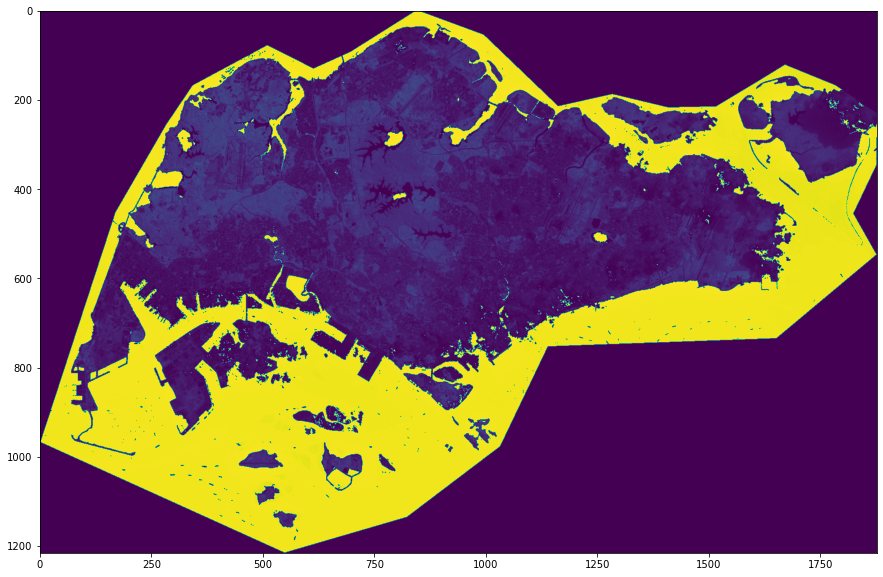

In [19]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2013['B5'].read(1) - SG_Bands_2013['B4'].read(1) )

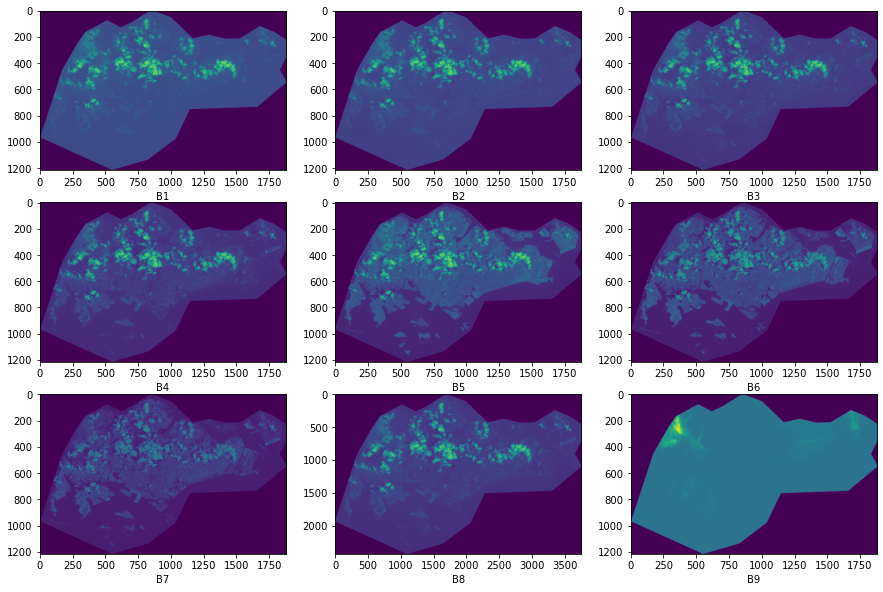

In [20]:
show_bands(SG_Bands_2014)

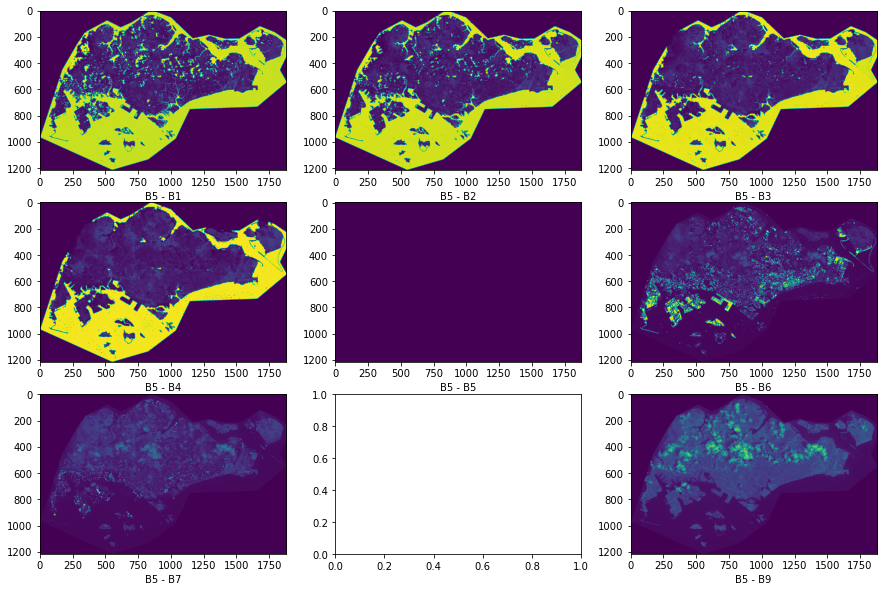

In [21]:
experiment(SG_Bands_2014, 5)

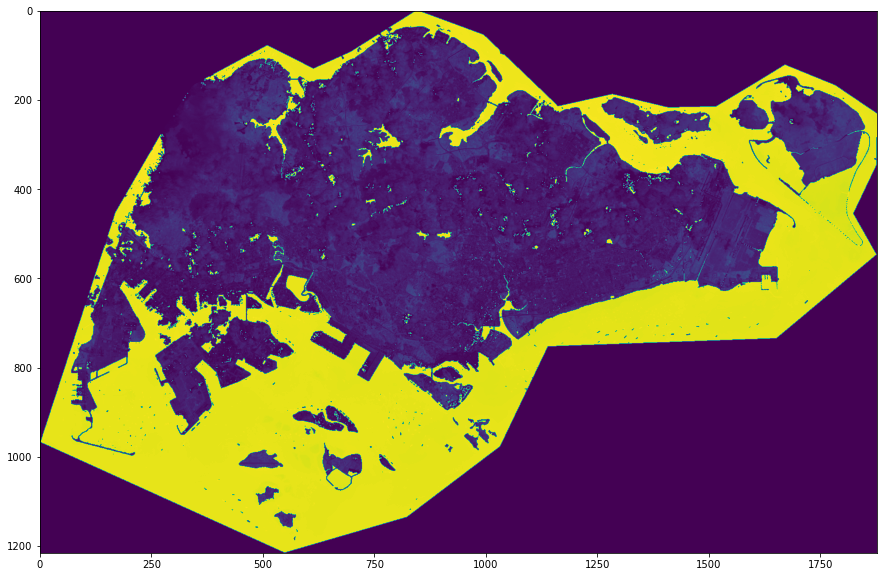

In [22]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2014['B5'].read(1) - SG_Bands_2014['B3'].read(1) )

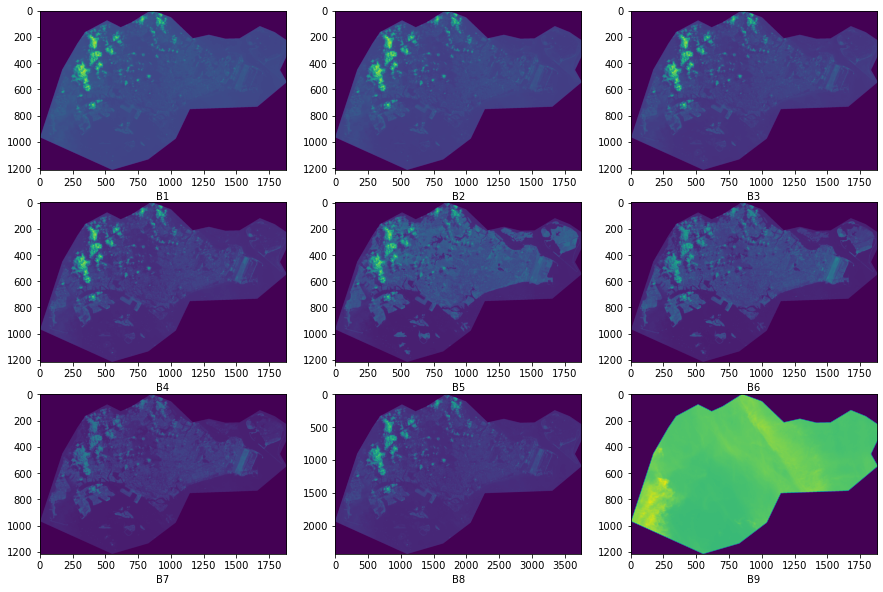

In [23]:
show_bands(SG_Bands_2015)

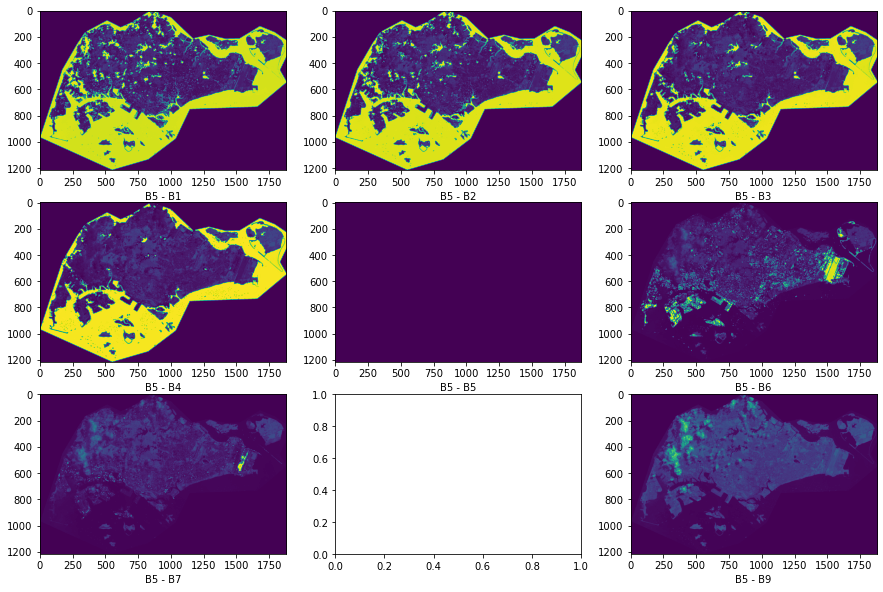

In [24]:
experiment(SG_Bands_2015, 5)

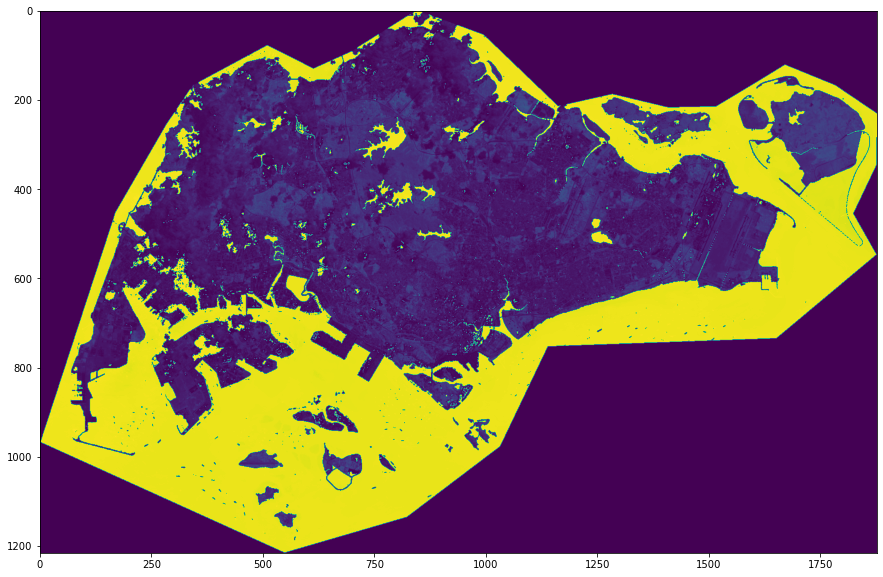

In [25]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2015['B5'].read(1) - SG_Bands_2015['B3'].read(1) )

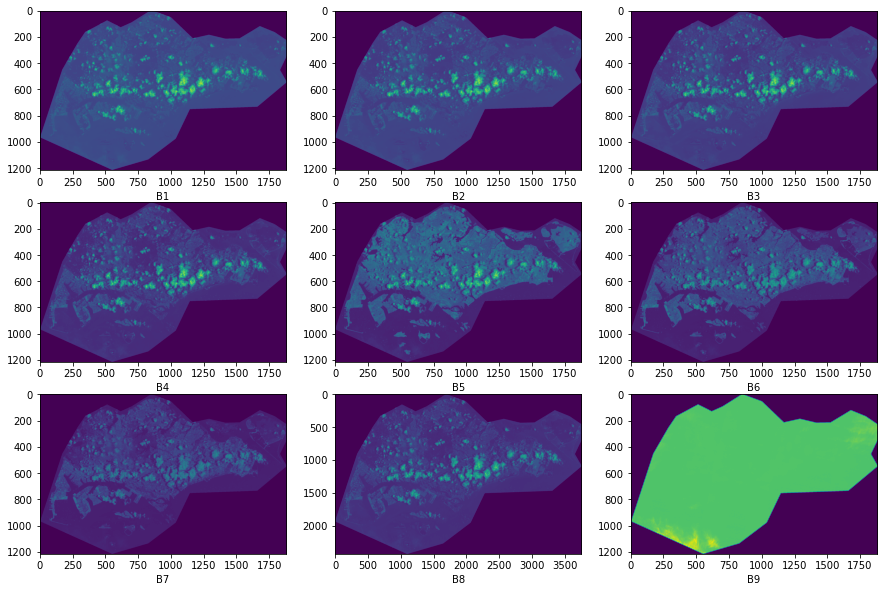

In [26]:
show_bands(SG_Bands_2016)

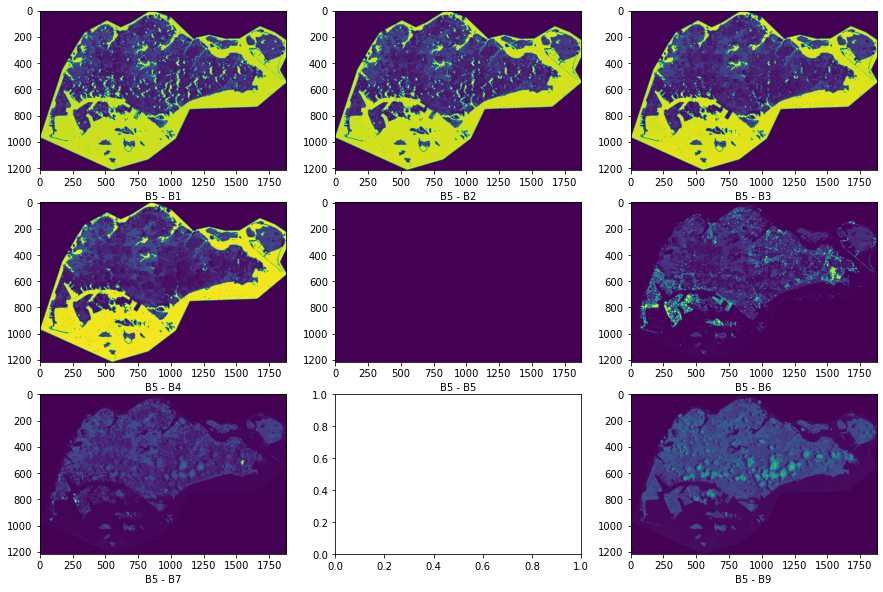

In [27]:
experiment(SG_Bands_2016, 5)

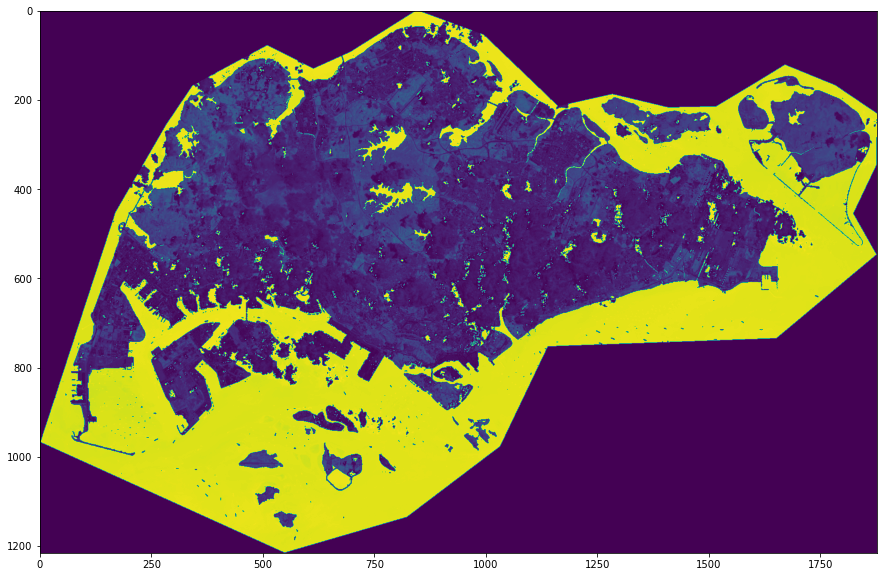

In [28]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2016['B5'].read(1) - SG_Bands_2016['B3'].read(1) )

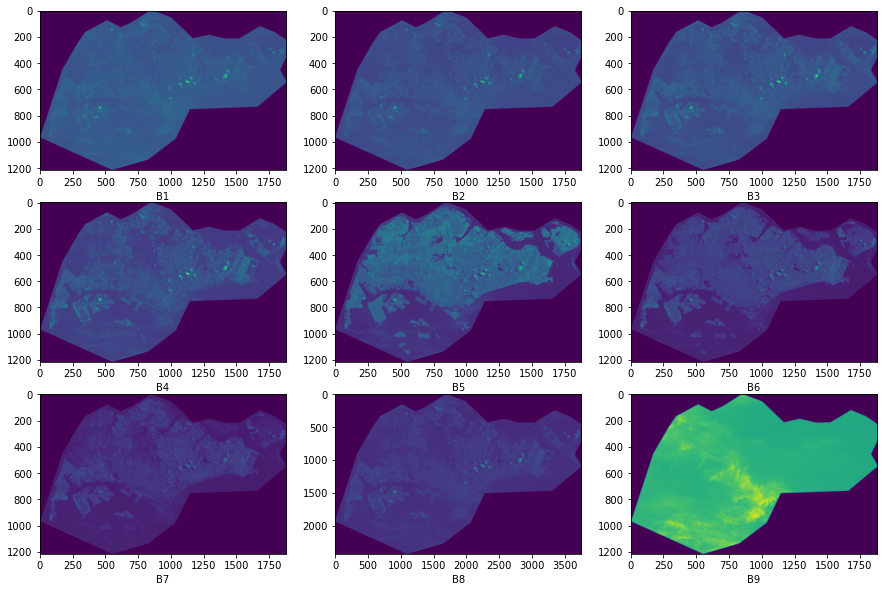

In [29]:
show_bands(SG_Bands_2017)

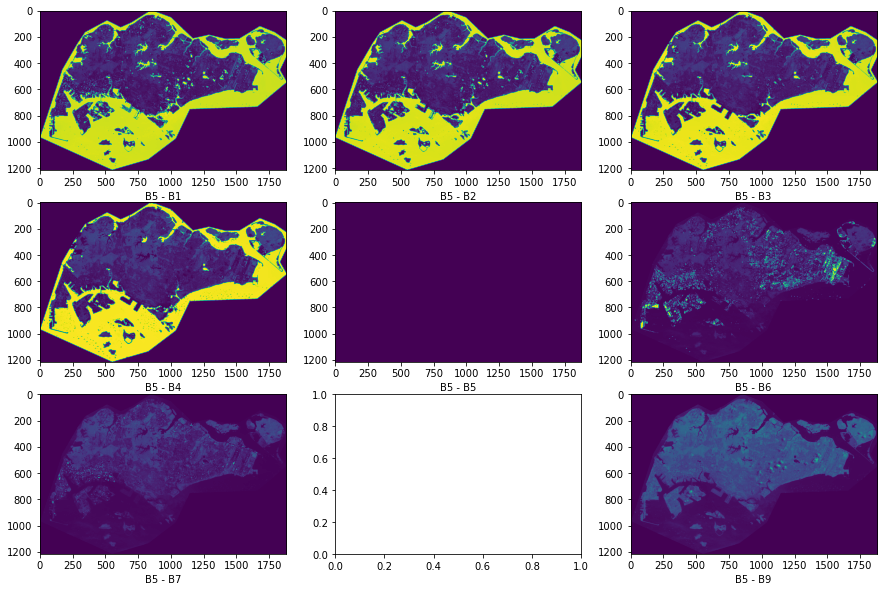

In [30]:
experiment(SG_Bands_2017, 5)

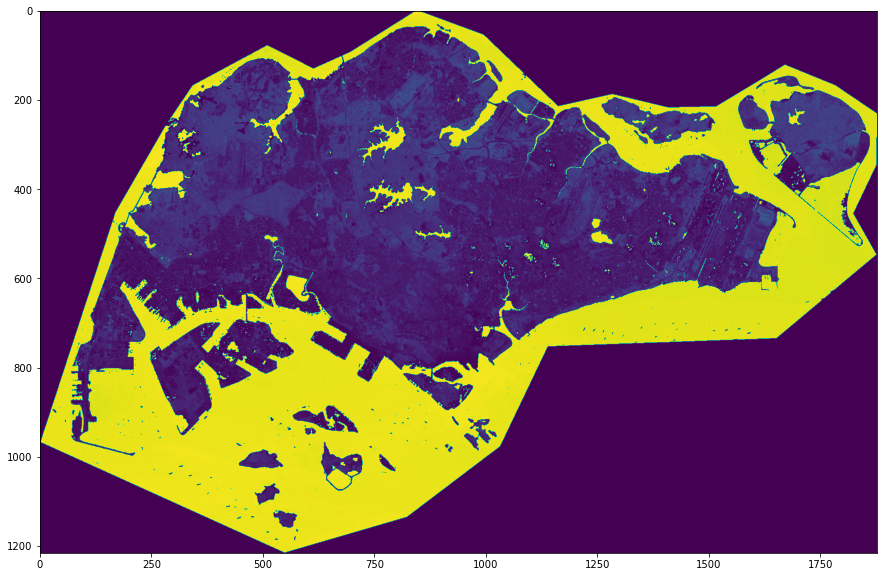

In [31]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2017['B5'].read(1) - SG_Bands_2017['B3'].read(1) )

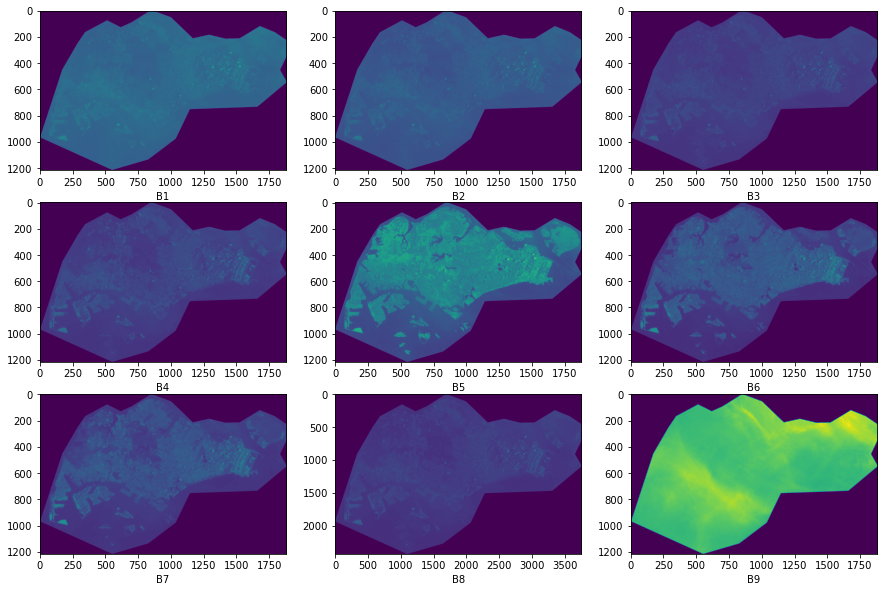

In [32]:
show_bands(SG_Bands_2018)

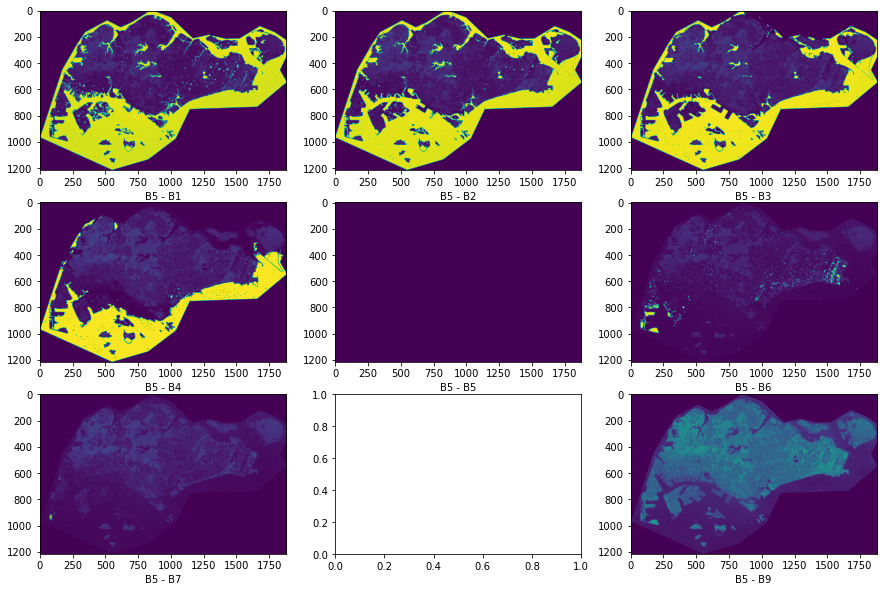

In [33]:
experiment(SG_Bands_2018, 5)

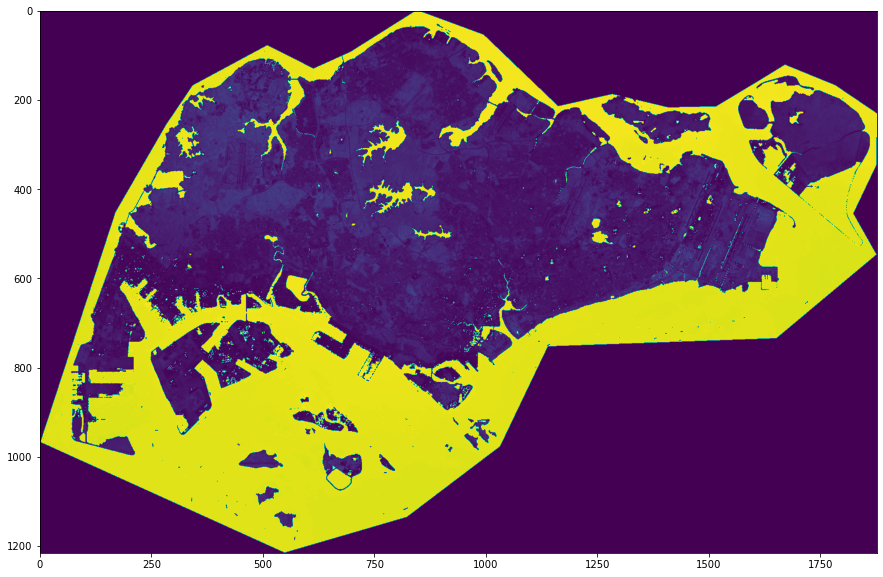

In [34]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2018['B5'].read(1) - SG_Bands_2018['B2'].read(1) )

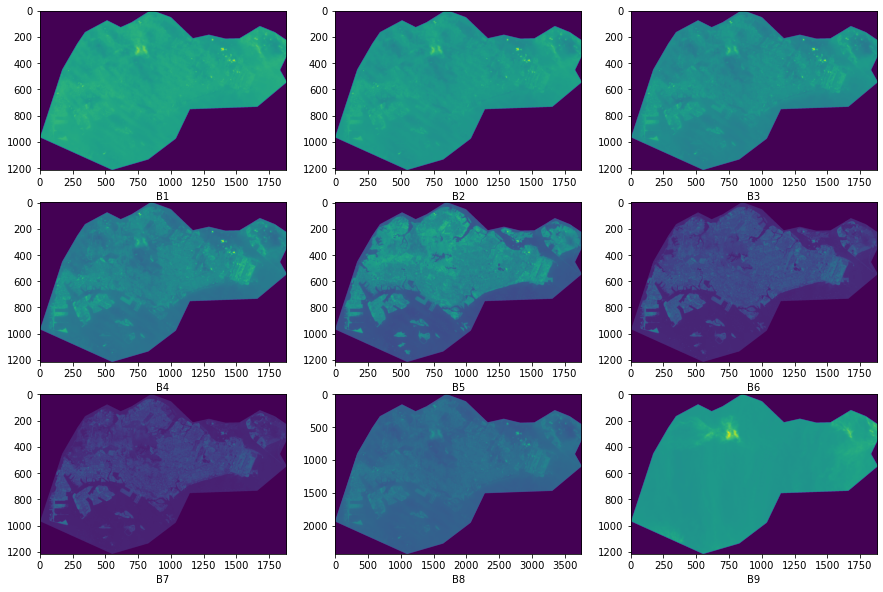

In [35]:
show_bands(SG_Bands_2019)

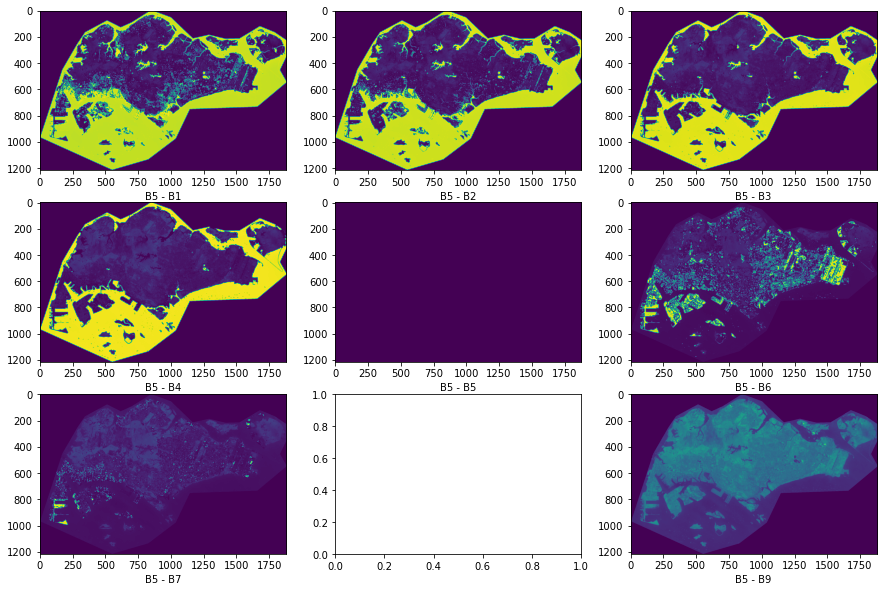

In [36]:
experiment(SG_Bands_2019, 5)

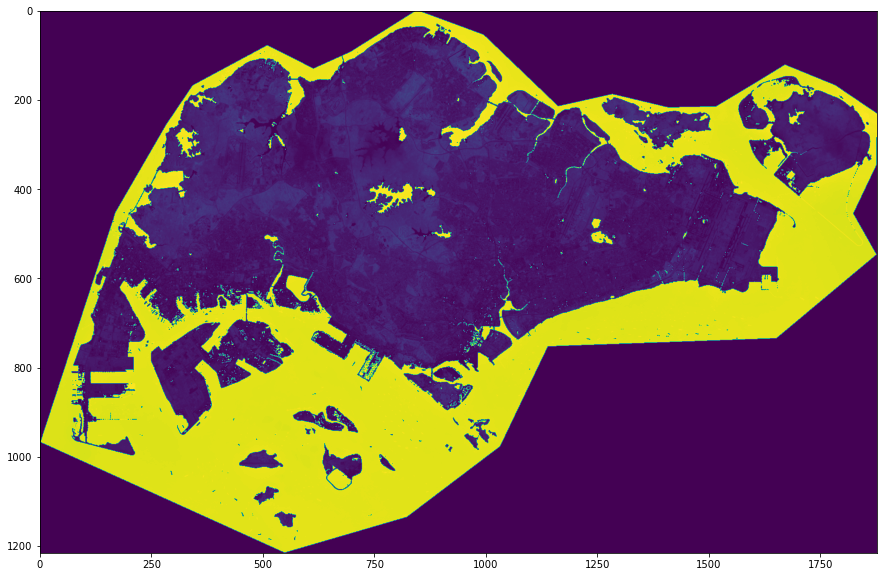

In [37]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2019['B5'].read(1) - SG_Bands_2019['B3'].read(1) )

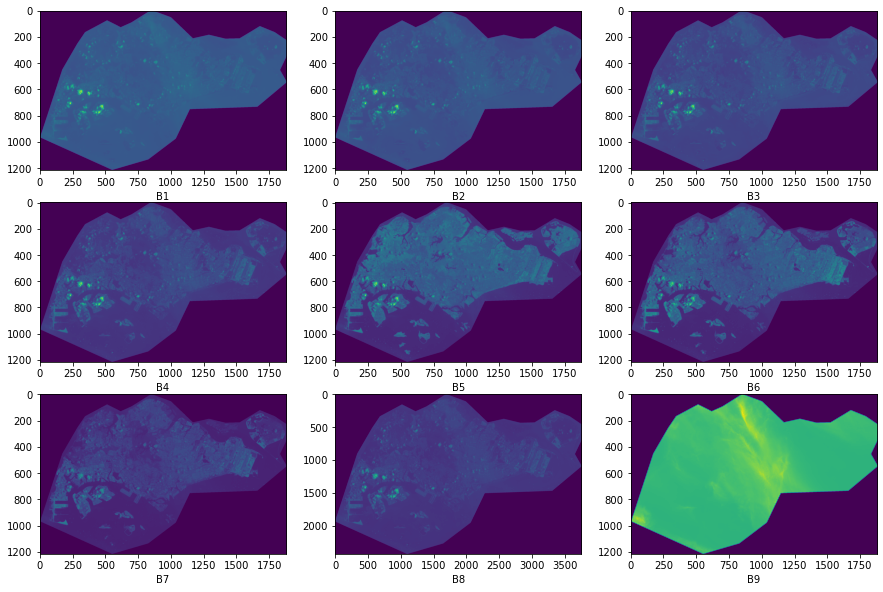

In [38]:
show_bands(SG_Bands_2020)

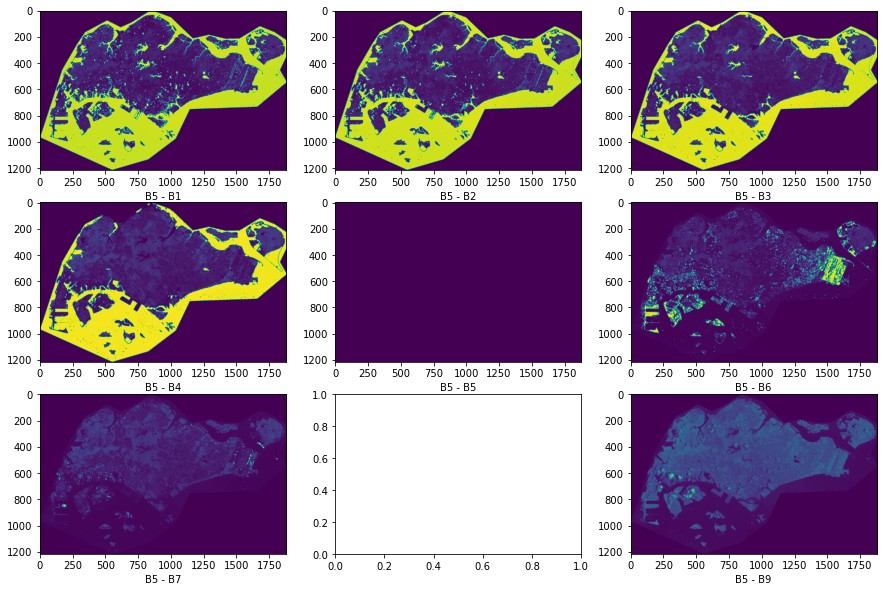

In [39]:
experiment(SG_Bands_2020, 5)

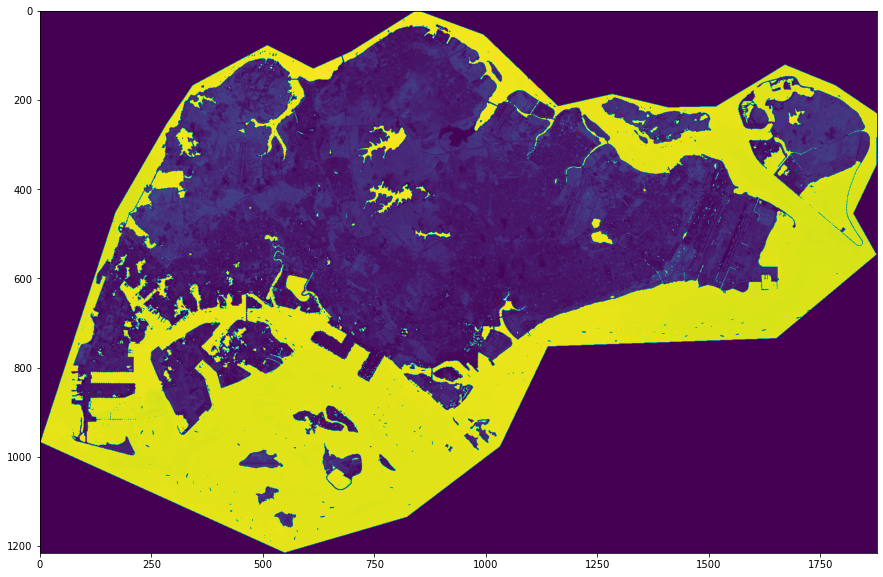

In [40]:
plt.figure(figsize = (15,10))
plt.imshow(SG_Bands_2020['B5'].read(1) - SG_Bands_2020['B3'].read(1) )

In [41]:
SG_imgs = {}
SG_imgs[2013] = SG_Bands_2013['B5'].read(1) - SG_Bands_2013['B3'].read(1)
SG_imgs[2014] = SG_Bands_2014['B5'].read(1) - SG_Bands_2014['B3'].read(1)
SG_imgs[2015] = SG_Bands_2015['B5'].read(1) - SG_Bands_2015['B3'].read(1)
SG_imgs[2016] = SG_Bands_2016['B5'].read(1) - SG_Bands_2016['B3'].read(1)
SG_imgs[2017] = SG_Bands_2017['B5'].read(1) - SG_Bands_2017['B3'].read(1)
SG_imgs[2018] = SG_Bands_2018['B5'].read(1) - SG_Bands_2018['B2'].read(1)
SG_imgs[2019] = SG_Bands_2019['B5'].read(1) - SG_Bands_2019['B3'].read(1)
SG_imgs[2020] = SG_Bands_2020['B5'].read(1) - SG_Bands_2020['B3'].read(1)

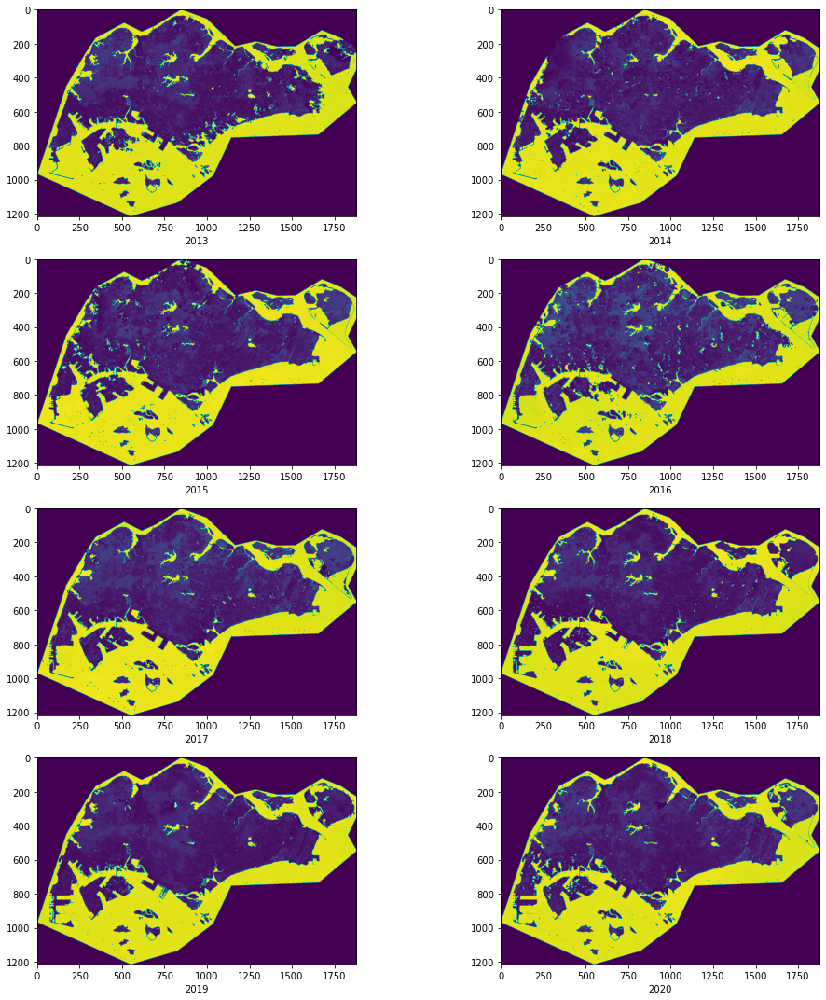

In [42]:
# Images that differentiate land and water the best

fig, ax = plt.subplots(len(SG_imgs)//2,2, figsize = (15,15))

num = 2013

for i in range(len(SG_imgs)//2):
    for j in range(2):
        ax[i, j].imshow(SG_imgs[num])
        ax[i, j].set_xlabel(num)
        num += 1
        
plt.tight_layout()



In [43]:
# Images flattened to 1D arrays
SG_imgs_flattened = {}
for i in range(2013,2021):
    print(SG_imgs[i].shape)
    SG_imgs_flattened[i] = SG_imgs[i].flatten()
    print(SG_imgs_flattened[i])

(1216, 1877)
[0 0 0 ... 0 0 0]
(1216, 1877)
[0 0 0 ... 0 0 0]
(1216, 1877)
[0 0 0 ... 0 0 0]
(1216, 1877)
[0 0 0 ... 0 0 0]
(1216, 1877)
[0 0 0 ... 0 0 0]
(1216, 1877)
[0 0 0 ... 0 0 0]
(1216, 1877)
[0 0 0 ... 0 0 0]
(1216, 1877)
[0 0 0 ... 0 0 0]


#### Plotting histograms to visualize land and water demarcation
- Most of the land and water pixels are clearly segregated.

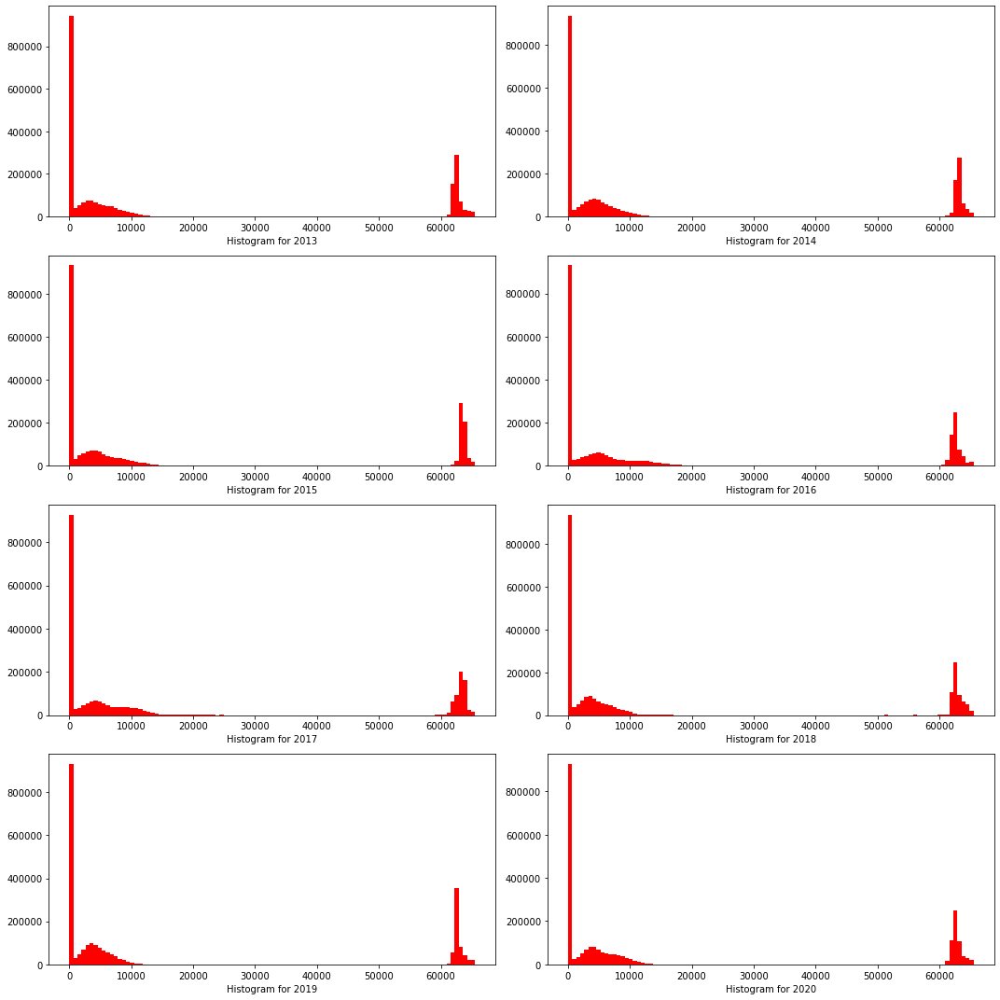

In [44]:
fig, ax = plt.subplots(len(SG_imgs)//2,2, figsize = (15,15))

num = 2013

for i in range(len(SG_imgs)//2):
    for j in range(2):
        ax[i, j].hist(SG_imgs_flattened[num], bins = 100, color = 'r')
        ax[i, j].set_xlabel("Histogram for " + str(num))
        num += 1
        
plt.tight_layout()



#### Cropped Landsat images of SG with respective Histograms

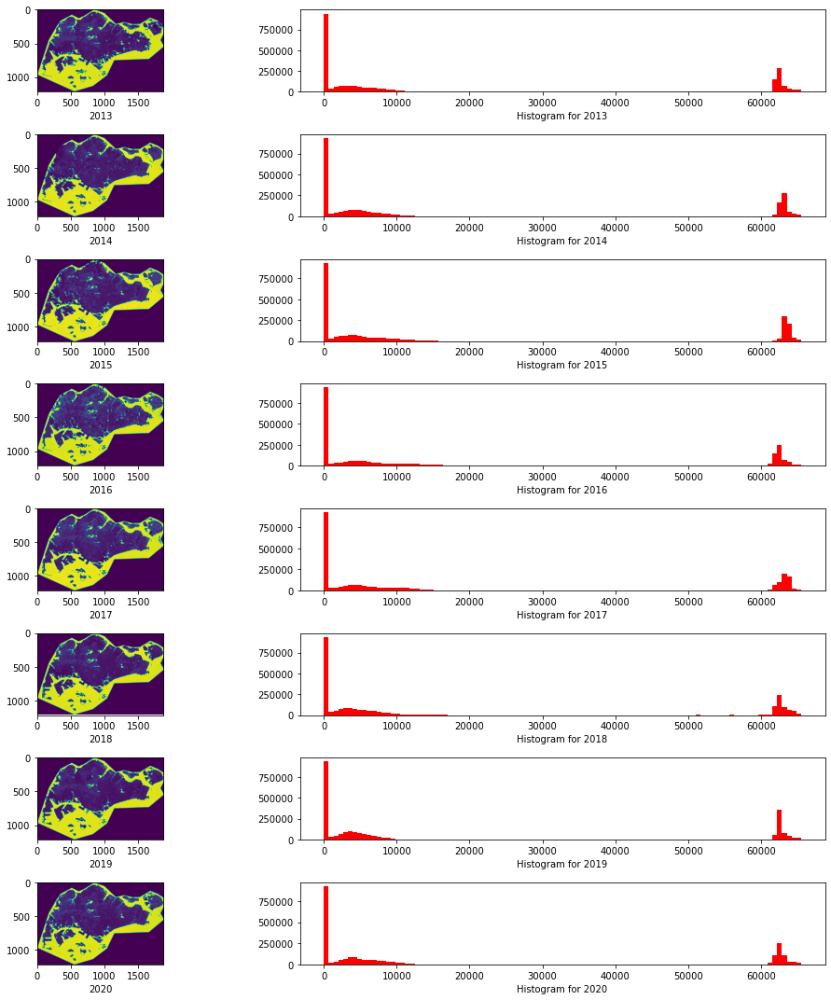

In [45]:
fig, ax = plt.subplots(len(SG_imgs),2, figsize = (15,15))

num = 2013

for i in range(len(SG_imgs)):
    ax[i,0].imshow(SG_imgs[num])
    ax[i,1].hist(SG_imgs_flattened[num], bins = 100, color = 'r')
    ax[i,0].set_xlabel(num)
    ax[i,1].set_xlabel("Histogram for " + str(num))
    num += 1
        
plt.tight_layout()



In [46]:
#show_histogram(SG_Bands_2013)

In [47]:
# Finding the total number of pixels in the manually drawn shapefile

SG_Bands_2013_flat = SG_Bands_2013['B9'].read(1).flatten()
#type(SG_Bands_2013_flat)

total_pixels_in_cropped_img = (SG_Bands_2013_flat > 0).sum()
print(total_pixels_in_cropped_img)

1372139


In [48]:
# Thresholding
def Thresholding():
    SG_binary_imgs_flat = {}
    for i in range(2013, 2021):
    
        SG_binary_imgs_flat[i] = np.zeros(len(SG_imgs_flattened[i]))
        
        for j in range(len(SG_imgs_flattened[i])):
            if SG_imgs_flattened[i][j] > 20000:
                SG_binary_imgs_flat[i][j] = 1
    
    return SG_binary_imgs_flat
                

In [49]:
SG_binary_imgs_flat = Thresholding()

In [50]:
SG_binary_imgs_flat_copy = SG_binary_imgs_flat.copy()

In [51]:
# Creating Binary image

SG_binary_imgs = {}
for i in range(2013, 2021):
    SG_binary_imgs[i] = SG_binary_imgs_flat_copy[i].reshape((1216,1877))

#### Binary Images

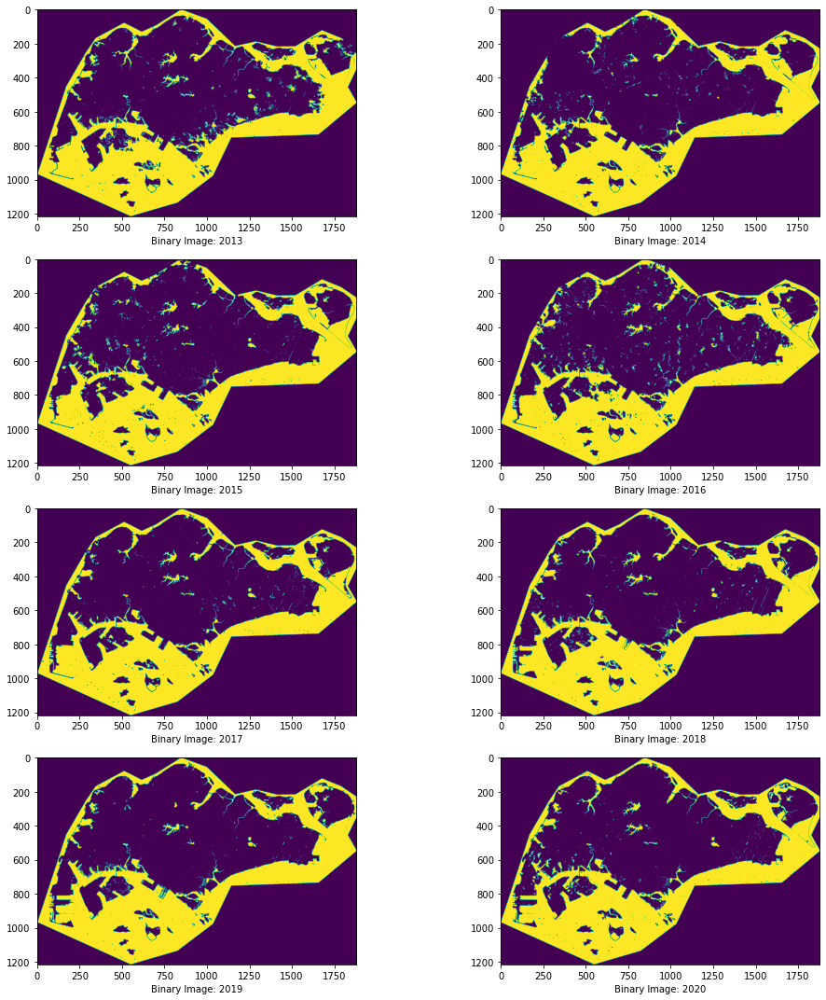

In [52]:
fig, ax = plt.subplots(len(SG_imgs)//2,2, figsize = (15,15))

num = 2013

for i in range(len(SG_imgs)//2):
    for j in range(2):
        ax[i, j].imshow(SG_binary_imgs[num])
        ax[i, j].set_xlabel("Binary Image: " + str(num))
        num += 1
        
plt.tight_layout()



In [53]:
#Counting number of pixels of water

SG_water_pixels = {}
for i in range(2013, 2021):
    SG_water_pixels[i] = (SG_binary_imgs_flat[i] == 1).sum()
    

In [54]:
#Counting number of pixels of land

SG_land_pixels = {}
for i in range(2013, 2021):
    SG_land_pixels[i] = total_pixels_in_cropped_img - SG_water_pixels[i]

In [55]:
for i in range(2013, 2021):
    print("Year: " + str(i))
    print("     #Pixels: " + str(SG_land_pixels[i]))

Year: 2013
     #Pixels: 774331
Year: 2014
     #Pixels: 800777
Year: 2015
     #Pixels: 791720
Year: 2016
     #Pixels: 795768
Year: 2017
     #Pixels: 801289
Year: 2018
     #Pixels: 790573
Year: 2019
     #Pixels: 798514
Year: 2020
     #Pixels: 798597


In [56]:
# Dictionary that has the area of SG Land in squared km based on no. land pixels
SG_area = {}

 # Data from https://data.gov.sg/

#### Formula converting number of pixels to land area

$C = constant$

$C * NumPixels = Area$

From 2015 data (Data from https://data.gov.sg/), 

$C * 791720 = 719.1$

$ ->  C =  0.0008947559682658218 $

In [57]:
C = 719.1/791720

for i in range(2013, 2021):
    SG_area[i] = [C * SG_land_pixels[i]]

In [58]:
719.1/791720

0.0009082756530086394

In [59]:
print(SG_area)

{2013: [703.3059946698328], 2014: [727.3262525892992], 2015: [719.1], 2016: [722.776699843379], 2017: [727.7912897236397], 2018: [718.058207825999], 2019: [725.2708247865406], 2020: [725.3462116657404]}


In [60]:
!pwd

/c/Users/Bharath/anaconda3/envs/SG_Land_Reclamation_analysis/SG_cropped_Landsat8_images


In [61]:
os.chdir('..')

In [62]:
os.chdir('HDB data')

In [63]:
!ls

dwelling-units-under-hdbs-management-by-town-and-flat-type.csv
estimated-percentage-of-singapore-resident-population-in-hdb-flats.csv
estimated-resident-population-in-hdb-flats-by-town.csv
Houses_by_type_2020.png
metadata-estimated-resident-population-living-in-hdb-flats.txt
metadata-number-of-residential-units-under-hdb-s-management.txt
metadata-total-land-area-of-singapore.txt
SG_population_data.csv
total-land-area-of-singapore.csv
World_bank_population_data.csv


In [64]:
SG_land_area_data = pd.read_csv('total-land-area-of-singapore.csv')

In [65]:
SG_land_area_data

,year,total_land_area
0,1960,581.5
1,1961,581.5
2,1962,581.5
3,1963,581.5
4,1964,581.5
5,1965,581.5
6,1966,581.5
7,1967,583.0
8,1968,584.3
9,1969,585.3


In [66]:
SG_land_area = pd.DataFrame(SG_area, index = ["total_land_area"])

In [67]:
SG_land_area

,2013,2014,2015,2016,2017,2018,2019,2020
total_land_area,703.305995,727.326253,719.1,722.7767,727.79129,718.058208,725.270825,725.346212


In [68]:
SG_land_area = SG_land_area.transpose()

In [69]:
SG_land_area = SG_land_area.reset_index()

In [70]:
SG_land_area = SG_land_area.rename(columns ={"index": "year"} )

#### Dataframe that tabulates total land area of SG over the lears

In [71]:
SG_land_area_data = SG_land_area_data.append(SG_land_area)

In [72]:
SG_land_area_data

,year,total_land_area
0,1960,581.500000
1,1961,581.500000
2,1962,581.500000
3,1963,581.500000
4,1964,581.500000
...,...,...
3,2016,722.776700
4,2017,727.791290
5,2018,718.058208
6,2019,725.270825


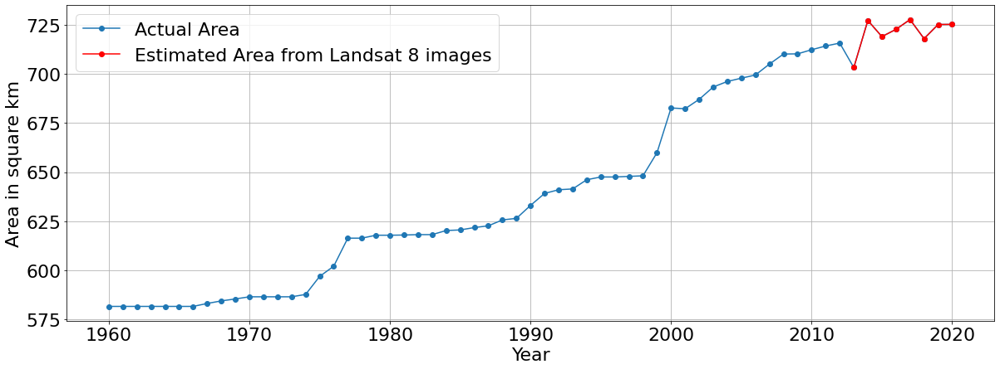

In [78]:
plt.rcParams.update({'font.size': 22})
plt.figure(figsize = (20,7))
plt.plot(SG_land_area_data['year'], SG_land_area_data['total_land_area'], '-o', label = 'Actual Area')
plt.plot(SG_land_area['year'], SG_land_area['total_land_area'], '-or', label = 'Estimated Area from Landsat 8 images')
plt.xlabel("Year")
plt.ylabel("Area in square km")
plt.legend()
plt.grid()

In [74]:
os.chdir('..')

In [75]:
os.chdir('Generated DataFrames/')

In [76]:
!pwd

/c/Users/Bharath/anaconda3/envs/SG_Land_Reclamation_analysis/Generated DataFrames


In [77]:
SG_land_area_data.to_csv('SG_land_area_data.csv', index= False)